In [80]:
#libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.formula.api import ols
import scipy.stats as ss

Ordinary Least Squares (OLS) is a fancy and general term for linear regression. A basic "Python for Data Analysis" course online or a high school stats class will teach you how to run one, and in college, a Linear Algebra course goes into projections and orthogonality and deals with the theoretical and numerical notes of regression. Singular Value Decomposition (SVD) is a technique for Dimensionality Reduction and Feature Extraction, where you start with a handful of independent variables and your job is to come up with new variables that are linear combinations of the variables you started with that summarize the information in the set well enough. This is an algorithm that works on data that you represent as matrices, just like OLS, but while alluded to in Statistical Methods courses in college and explained numerically in a Linear Algebra or Optimization course, it is a different technique from OLS altogether.

Due to the overlap in theory and terminology and also in functional form, it's useful to know about how these techniques work while discussing the differences. For example, consider this gif:

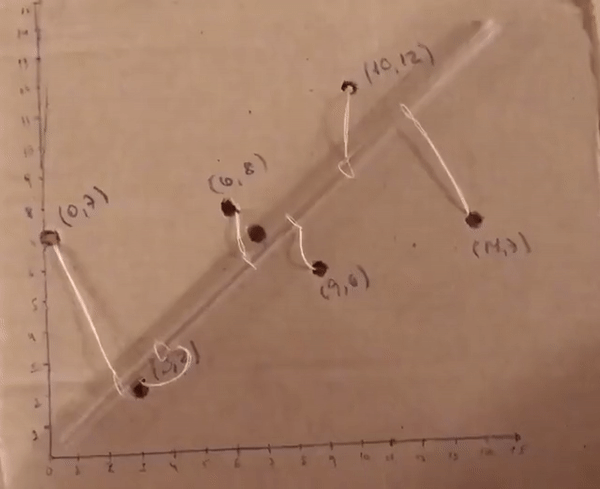

This is from a reddit thread titled "Line of best fit visualized" 

(Link: https://www.reddit.com/r/interestingasfuck/comments/k40puy/line_of_best_fit_visualised/https://www.reddit.com/r/interestingasfuck/comments/k40puy/line_of_best_fit_visualised/)

To be fair, this is a very interesting concept and a very cool gif, but it isn't linear regression. It looks a lot like finding the "best fitting line" for a dataset of 6 observations and two variables, and the line appears to change into a better fit assuming that we have a linear trend. Initially, the strings are loose, but once they become taut, the straw (representing a linear model) is pulled into the position where it appears to fit the data best. The angles between each string and the straw look nearly perpendicular. For the price of a very small dataset, you could give headaches to both your Statics class and your Statistics class. The power of Dimensionality Reduction, right?

Wrong. And it's not just some fancy detail that's wrong here, but the entire concept of "fit" here that is wrong. There are plenty of comments in this thread pointing out that this is not linear regression. 

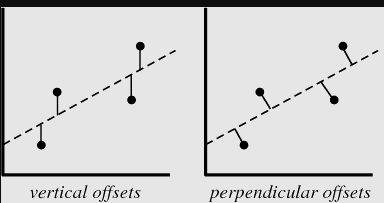

(Link: https://www.quora.com/What-is-the-difference-between-singular-value-decomposition-and-multiple-linear-regression)

This image gives a very basic explanation of what appears to be wrong here- rather than minimizing the sum of the squares of vertical offsets like you would with a OLS Best Fit Line, we are minimizing the sum of squares of perpendicular offsets, resulting in a different linear model. Since the points in the gif are labeled, we can actually go ahead and find both the OLS Best Fit Regression Line and the PCA Best Fit Line:

In [81]:
df = pd.DataFrame()
x = np.array([0,3,6,9,10,14],dtype=int)
y = np.array([7,2,8,6,12,7],dtype=int)
df['x'] = x
df['y'] = y
df.describe()

,x,y
count,6.000000,6.000000
mean,7.000000,7.000000
std,5.059644,3.224903
min,0.000000,2.000000
25%,3.750000,6.250000
50%,7.500000,7.000000
75%,9.750000,7.750000
max,14.000000,12.000000


In [82]:
print(df.corr().values[0,1])

0.3922322702763681


We have a small positive linear correlation between y and x. 

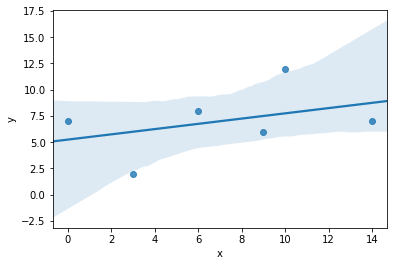

In [83]:
sns.regplot(x='x',y='y',data=df)

And a resplot would give the residuals:

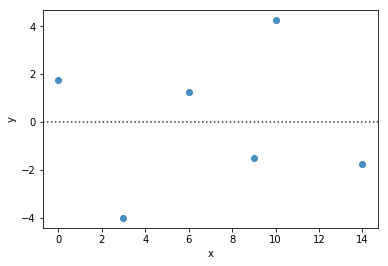

In [84]:
sns.residplot(data=df,x='x',y='y')

The OLS Best Fit Line can be easily determined:

In [85]:
Y = y
X = x
X = sm.add_constant(X)
model = sm.OLS(Y,X).fit()
preds = model.predict(X)
print_model = model.summary()
print(print_model)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.154
Model:                            OLS   Adj. R-squared:                 -0.058
Method:                 Least Squares   F-statistic:                    0.7273
Date:                Mon, 03 Oct 2022   Prob (F-statistic):              0.442
Time:                        14:24:34   Log-Likelihood:                -14.491
No. Observations:                   6   AIC:                             32.98
Df Residuals:                       4   BIC:                             32.57
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          5.2500      2.459      2.135      0.1

C:\Users\Sebastian\Anaconda3plus\lib\site-packages\statsmodels\stats\stattools.py:72: ValueWarning: omni_normtest is not valid with less than 8 observations; 6 samples were given.
  "samples were given." % int(n), ValueWarning)


We have a OLS Best Fit Line of:

$Y = 5.25 + .25X$

The $R^2$ here is low and the p-values are high, and we even get a warning about the small sample size. However, this line minimizes the sum of squares of the error in our model. To find the other line, we have to figure out how to minimize the perpendicular distance. To do this, we can create a symmetric matrix for the data matrix:

In [86]:
X = df.values - df.mean().values
A = np.matmul(X.transpose(),X)
A

array([[128.,  32.],
       [ 32.,  52.]])

From here, you would figure out the eigens for the matrix:

In [87]:
print(np.linalg.eig(A))

(array([139.67896939,  40.32103061]), array([[ 0.93939108, -0.34284749],
       [ 0.34284749,  0.93939108]]))


From this eigen-spectrum, gather the largest eigenvalue (all eigenvalues of symmetric real matrices are positive and real) and the corresponding eigenvector. The square root of the largest eigenvalue is the primary singular value, whereas the eigenvector needs to be normed so that it is unitary:

In [88]:
sv = np.sqrt(np.linalg.eig(A)[0][0])
v = np.linalg.eig(A)[1][:,0]
print(sv,v)

11.818585761143204 [0.93939108 0.34284749]


The SVD / Eigen-decomposition makes it decently easy then to find a equation for the Fit that minimizes the sum of squares of perpendicular distances. We have one point on this line- the means of both variables, and then we have the slope of the line as the ratio of the y to the x component of the eigenmatrix. So we can figure this out:

In [89]:
point_in_line = df.mean().values
slope = v[1]/v[0]
b0 = point_in_line[1] - slope*point_in_line[0]
b1 = slope
print(b0,b1)

4.445225445172557 0.36496779354677755


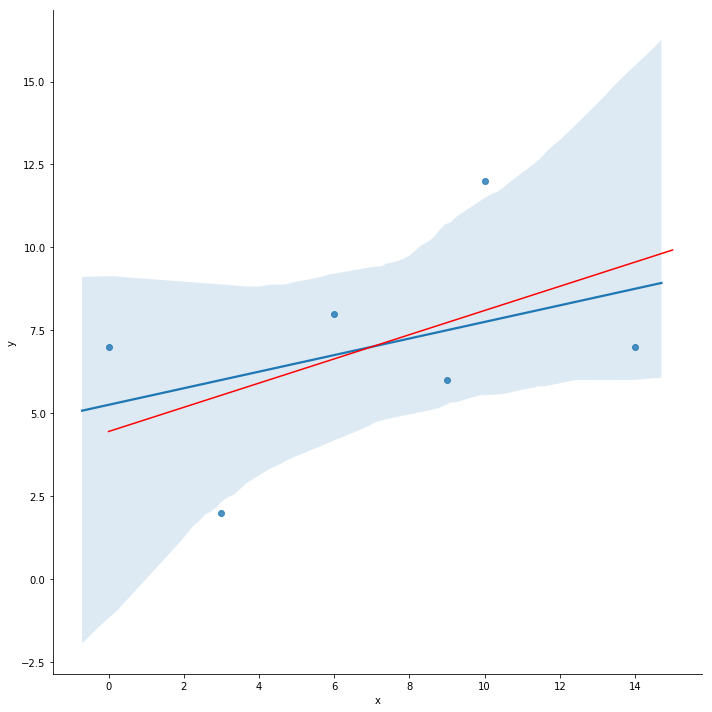

In [90]:
u = np.linspace(0,15,500)
v = b0 + b1*u
g = sns.FacetGrid(df,height=10)
g = g.map(sns.regplot, "x", "y")
plt.plot(u,v, color='r')
plt.show()

This plot displays a regplot of the dataset with the OLS best fit line in blue, along with a 95% confidence interval, whereas the red line is the result from the eigen-decomposition. Clearly these are two different lines, which are not parallel, but they appear relatively close to one another. 